# Modern Portfolio theory 

The basic idea of Modern portoflio thoery is to use te power of diversificatoin to achieve a the minimum level of volatility from a portfolio ffrom a desired target level of investment return! 


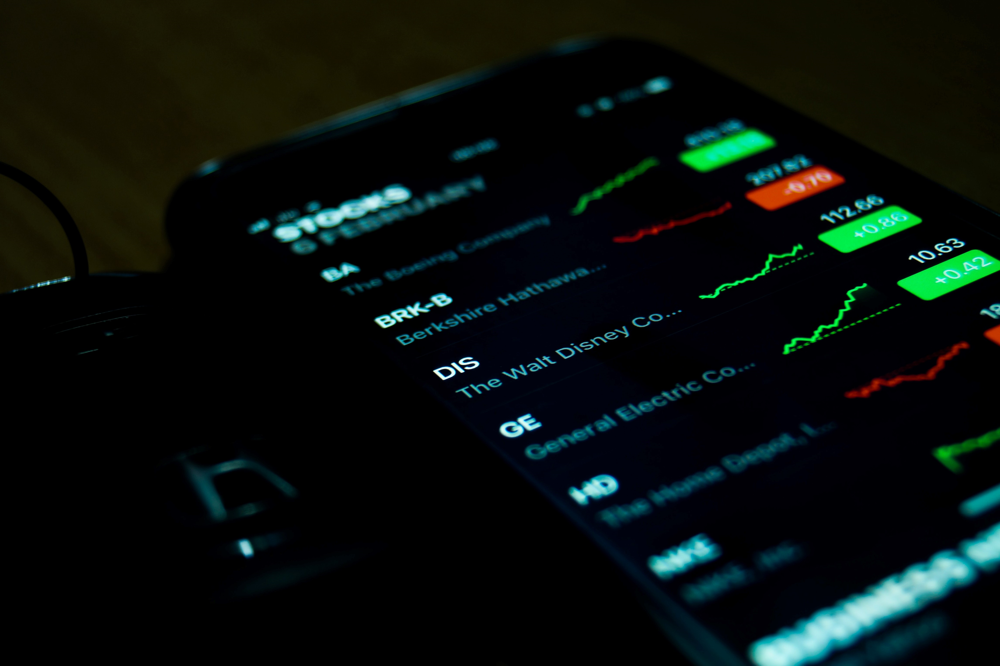



# Step 1 - Portfolio optimisation and the normal distibution

The normal distirbution can be considered the most important distribution in finance and one of the major statistical building 
blocks of financial theory. The following well known financial theories all rest on the assumption that fincial instrument returns are normally distributed:
    
    1) Portfolio thoery
    
    2) Capital Asset Pricing Model 
    
    3) Efficient Markets hypothesis 
    
    4) Options pricing theory using geometric brownnian motion 
    
below and through this workbook I will take a look at 4 financial instruments: Starbucks, BP Macdonalds and Gold and see if this important assumption holds true. 


array([[<matplotlib.axes._subplots.AxesSubplot object at 0x0000029B4CC47B88>,
      dtype=object)

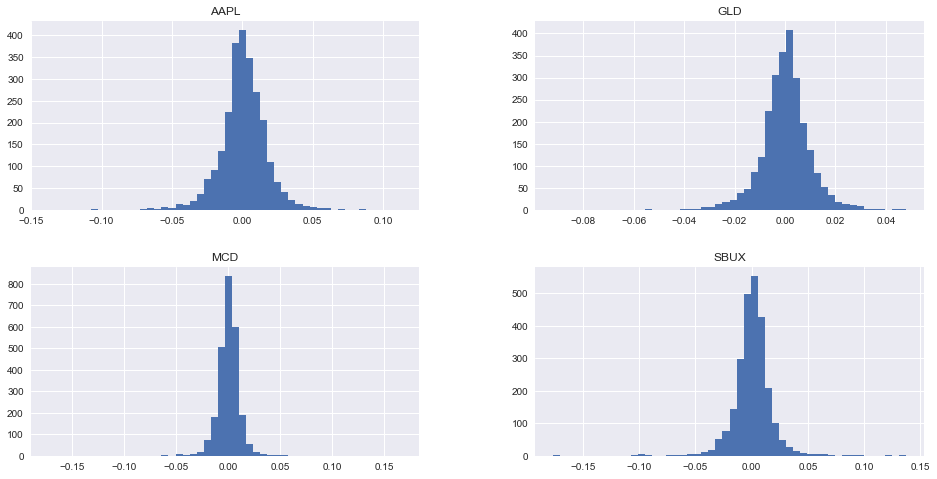

In [66]:
import numpy as np
import math
import scipy.stats as scs
import matplotlib.pyplot as plt
import pandas as pd

plt.style.use('seaborn')

""" I am going to looking at the statistical characterisitics of financial instruments in this notebook so I am going to
write a function for describing there key charachterisitics """

def print_statistics(array): 
    """ Returns min max mean and stdev of array
    args:
        
        array(np.array): the financial returns of the instrument
        
    Returns
    
        min(float), max(float), mean(float), std(float)
    """
    import scipy.stats as scs   
    stats=scs.describe(array)
    
    print('%14s %15s' % ('statistic','value'))
    print(30*'-')
    print('%14s %15s' % ('min',stats[1][0]))
    print('%14s %15s' % ('max',stats[1][1]))
    print('%14s %15s' % ('mean',stats[2]))
    print('%14s %15s' % ('standard dev',stats[3]))
    print('%14s %15s' % ('skew',stats[4]))
    print('%14s %15s' % ('kurtosis',stats[5]))
    
def import_returns(ticker):
    """ returns daily data of a stock I have storedd locally"""
    
    import pandas as pd
    data = pd.read_csv(r"C:\Users\Adam\Desktop\Personal\Python Syntax\Python Input Files\finance\{}.csv".format(ticker), parse_dates=True ,index_col=0)
    data.sort_index(ascending=True, inplace=True)
    data['Log_Return'] = np.log((data['Price'])/data['Price'].shift(1))
    data.dropna(inplace=True)
    return data 

"""    
First of all we are going we are going to test the theory that financial instruments can 
be modelled using normal distirbutions by actually looking at the returns of some instruments that
we will later put into a portfolio. The stocks are Apple stock, BP stock, Macdonalds, Stock and 
"""

SBUX = import_returns('SBUX')['Log_Return']
APPL = import_returns('APPL')['Log_Return']
MCD = import_returns('MCD')['Log_Return']
GLD = import_returns('GLD')['Log_Return']

All_data = pd.concat([SBUX,APPL,MCD,GLD],axis=1,join='inner')
All_data.columns=['SBUX','AAPL','MCD','GLD']

""" upon first inspection the graphs suggest that each if the instruments do seem to have a normal esque."""

All_data.hist(bins=50,figsize=(16,8))

# Step 2 - Analysing financial return distributions

Looking at the return distributions above, from first naked eye inspection the returns seem to possess normal characteristics.

But plotting an actuard normal distbiution onto the gold returns as shpwn below shows that the distribution is infact not quite normal. By utilising the scipy statisitcs package we are able to apply functions to the data to gain information around the exact characteristics of the distributions, mainly: mean std, skew kurtosis. A standad normal distribution has stdev 1, mean 0, skew 0 and kurtosis or almost 0.

What we see is that the Gold ETF returns actually exhibit some negative skew and a high level of kurtosis (fat tails)

     statistic           value
------------------------------
           min -0.0919050771872711
           max 0.04795327931520292
          mean 0.00014189142341449452
  standard dev 9.885103470751047e-05
          skew -0.5124653790178745
      kurtosis 5.8306034351925025


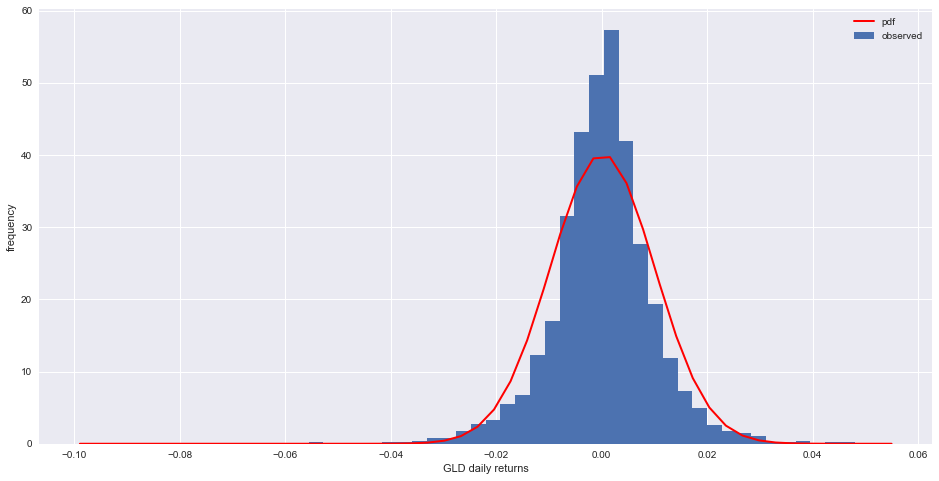

In [64]:
""" we can plot a hypothetical normaldistibution using the normal and stdeviation of the returns to get a 
better look. The Gold returns distribuions is narrower than a normal distribution  with a longer tail it 
exhibits positive kurtosis also known as leptokurtic""" 

plt.figure(figsize=(16,8))
GLD.hist(bins=50,  label ='observed', density = True)
plt.xlabel('Distribution of GLD ETF daily returns')
plt.xlabel('GLD daily returns')
plt.ylabel('frequency')

x=np.linspace(plt.axis()[0],plt.axis()[1])
plt.plot(x, scs.norm.pdf(x, GLD.mean(),GLD.std()), color='r',lw=2.0, label = 'pdf')
plt.legend()

""" we can confirm this by printing the statistics - and as shown from the graph
the kurtosis is not close to zero showing the distribution does not follow that of a normal distbution.
It also exhibits some negative skew - the left tail is longer than the right"""

print_statistics(GLD)

# Step 3 - Analysing financial return distributions CONTINUED

Instead of analysing the characteristics of the returns we can actually employ tests from the scipy package that
return to us the p values of the distribution metrics allowing us to confirm with a level of cartainity whether
we believe a distribution is normally distributed.

What we find below is that the p values for the normal test for all 4 instruments is 0 strongly rejecting the hypothesis
that financial insturment returns are strongly distributed - and this has lead to the need to develop richer models such as the fjump dissusion or stochastic volatility to create fatter tailed distrbutions

In [67]:
""" 
We can test simply for normally using the scs functions I have built some standard nomrlaity tests into the custom functino below
"""

def normality_test(array):
    """ test the normality of a series or array
    args:
        
        array(np.array or pd.series) : data set to be tested for normality
    """
    print('Skew of data set: %8.3f' % scs.skew(array))
    print('Skew test p-value: %7.3f' % scs.skewtest(array)[1])
    print('Kurt of data set: %8.3f' % scs.kurtosis(array))
    print('Kurt test p value: %7.3f' % scs.kurtosistest(array)[1])
    print('normal test p value: %4.3f' % scs.normaltest(array)[1])


""" what you can see us that gold fails all 3 test showing that its returns are not accurately represented by a normal distribution """

print("Gold returns distribution characterisitcs and p values")
normality_test(GLD)
print('\n' + "Starbucks returns distribution characterisitcs and p values")
normality_test(SBUX)
print('\n' + "APPL returns distribution characterisitcs and p values")
normality_test(APPL)
print('\n' + "Mcdonalds returns distribution characterisitcs and p values")
normality_test(MCD)

Gold returns distribution characterisitcs and p values
Skew of data set:   -0.512
Skew test p-value:   0.000
Kurt of data set:    5.831
Kurt test p value:   0.000
normal test p value: 0.000

Starbucks returns distribution characterisitcs and p values
Skew of data set:   -0.268
Skew test p-value:   0.000
Kurt of data set:   13.046
Kurt test p value:   0.000
normal test p value: 0.000

APPL returns distribution characterisitcs and p values
Skew of data set:   -0.348
Skew test p-value:   0.000
Kurt of data set:    6.955
Kurt test p value:   0.000
normal test p value: 0.000

Mcdonalds returns distribution characterisitcs and p values
Skew of data set:   -0.158
Skew test p-value:   0.001
Kurt of data set:   37.384
Kurt test p value:   0.000
normal test p value: 0.000


# step 4 - mean variance portfolio theory 

 Regardless of the above the mean variance portoflio thoery (MPT) is still a corner stone within financial theory and within MPT there are two main equations: 

* the Expected portfolio return = sum over all instruments ( insturment weight * insturment annualised return) 

* the Expected portfolio Variance = the quare root of (the sum over all instrument pair combinations (the covariance between two the stocks multipled by their individual portoflio weightings))

The basic idea of MPT is to make use of diversification to achieve a minimal portfolio risk (quanitified as the standard deviation of the returns of the portfolio) for a given a target return. The risk within a portoflio of assets may change dependent upon the weighting of the finacnial instruments within the portfolio. We can iterate through all possible options of weights to understand the risk return characteristics of potential portfolio driven by the weightings. 

Uisng a 25% weighting for all 4 instruments: Starbucks, Apple, Mcdonalds and Gold ETF we would expect a 1 yr return of 6.15% and a volatility of 10.9%

In [71]:
def import_annual_returns(ticker):
    
    import pandas as pd
    data = pd.read_csv(r"C:\Users\Adam\Desktop\Personal\Python Syntax\Python Input Files\finance\{}.csv".format(ticker), parse_dates=True ,index_col=0)
    data.sort_index(ascending=True, inplace=True)
    data = data.resample('1Y').last()
    data['Annual_Log_Return'] = np.log((data['Price'])/data['Price'].shift(1))
    data.dropna(inplace=True)
    return data 


SBUX = import_annual_returns('SBUX')['Annual_Log_Return']
APPL = import_annual_returns('APPL')['Annual_Log_Return']
MCD = import_annual_returns('MCD')['Annual_Log_Return']
GLD = import_annual_returns('GLD')['Annual_Log_Return']

annual_returns = pd.concat([SBUX,APPL,MCD,GLD],axis=1,join='inner')
annual_returns.columns=['SBUX','APPL','MCD','GLD']

""" In portfolio thory all position must be long so our first basic portolfio will just be a 25% split across all 4 instruments """


portfolio_weights = np.array([0.25,0.25,0.25,0.25])

mean_annual_returns = np.array(annual_returns.mean())

Expected_Portfolio_Return = np.dot(portfolio_weights.T,mean_annual_returns)

#the .cov methdo returns the covariance between each instrument in a 2d array 
Expected_Portfolio_Volatility = math.sqrt(np.dot(portfolio_weights.T,np.dot(annual_returns.cov(),portfolio_weights.T)))

import math

print( "The expected portfolio return from a portfolio split 25% each \
is: {0: 2.2f}% and has volatility:{1: 2.2f}%".format(Expected_Portfolio_Return*100,Expected_Portfolio_Volatility*100))
      
      
      

The expected portfolio return from a portfolio split 25% each is:  11.07% and has volatility: 10.72%


# step 5 - portofolio simulation through monte carlo simulation 

Of paramount interest to investors is what risk-return profiles are possible for a given set of fincnaicl instruments, and their statistical characteristics. To this end I can implement a monte carlo simulation to create a risk return exhibit for all possible portfolio our 4 different financial instruments to understand the sharpe ratio
of different portfolio and construct the efficient frontier """ 

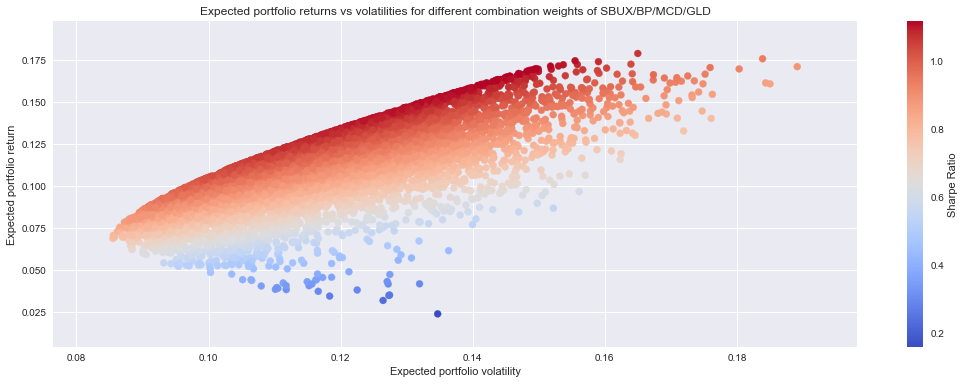

In [80]:
def portfolio_return(portfolio_weights):
     return np.dot(portfolio_weights.T,np.array(annual_returns.mean()))
     
def portfolio_volatility(portfolio_weights):
     return math.sqrt(np.dot(portfolio_weights.T,np.dot(annual_returns.cov(),portfolio_weights.T)))

portfolio_returns = []
portfolio_volatilities= [] 

import numpy.random as random 

for portfolio_mix in range(10000):
    
    weights = random.rand(len(annual_returns.columns))
    weights = weights / weights.sum()
    
    portfolio_returns.append(portfolio_return(weights))
    portfolio_volatilities.append(portfolio_volatility(weights))

portfolio_returns = np.array(portfolio_returns)
portfolio_volatilities = np.array(portfolio_volatilities)   
    
"""
The sharpe ratio gives us an indication of risk adjusted returns of a portfolio, the higher the sharpe ratio
the greater the risk adjusted returns 

sharpe ratio = (portfolio return - riskfree rate)/portfolio volatility

the riskfree at the moment in the UK = 0.25% """

Rf = 0.0025

Sharpe_Ratios = (portfolio_returns-Rf)/portfolio_volatilities

plt.figure(figsize = (18,6))
plt.scatter(portfolio_volatilities,portfolio_returns, c = Sharpe_Ratios, marker ='o' , cmap ='coolwarm')
plt.title('Expected portfolio returns vs volatilities for different combination weights of SBUX/BP/MCD/GLD')
plt.ylabel('Expected portfolio return')
plt.xlabel('Expected portfolio volatility')
plt.colorbar(label = 'Sharpe Ratio')

# step 5 - Identifiying the maxmium sharpe retrun portoflio 

The optimum portfolio weighting for a portoflio of our risky assets is that with the maximum sharpe ratio as it 
provides the highest risk adjusted return.

To find the portfolio we can utilise the scipy analytics package. I will use the scipy minimize function which acts as a "solver" algorithmn which iterates through
define paramters (in this case the weightings) to optimize a given function (the sharpe ratio). The steps I'll follow will be:
    
    
  1)  Define the function to minimize: in our case the negative sharpe value
    
  2)  Define the paramters to iterate through: in this case the portfolio weights
    
  3)  Define the algorithmn for finding the minized result: in this case sequential least squares fitting
    
  4)  Define the upper and lower bounds for the parameters: in this case 0 to 1 as one instrunment can not have more than a 100% portfolio weight
    
  5)  Define any constraints for the problem: in this case the weights of the instruments must total 100%  
    

A portfolio however does not just have to be created from risky assets (such as stocks/ bonds etc) it can contain cash (a riskless asset)
therefore to find the maximum sharpe portfolio from both (risky and non risky assets) we need 



In [81]:
import scipy.optimize as sco 

#number 1) the output to minimize 

def minimum_sharpe(weights):
    return - (portfolio_return(weights) - Rf)/portfolio_volatility(portfolio_weights)

#number 2) the parameters to iterate throught - inputted as an intial values array

weights = np.array([0.25,0.25,0.25,0.25])

#number 3) the minimizsing algo 

minimizing_algo = 'SLSQP'

#4) establishing paramter boundaries, the weight for each instrument must reside between 0 and 1 entered as a tuple of tuples

boundaries = tuple((0.0,1) for x in range(len(annual_returns.columns)))

#step 5 ) optimizing constraint - also entered as a tuple - input paramters must sum to 1

constraints = ({'type' : 'eq', 'fun': lambda x: np.sum(x)-1})


optimized_params_sharpe = sco.minimize(minimum_sharpe, weights, method = minimizing_algo , bounds = boundaries , constraints = constraints) 

print(optimized_params_sharpe)

#access the weights attribute of the optimization and round to 3 dp
sharpe_optimized_weights = optimized_params_sharpe['x'].round(3)

""" enter this back into our portfolio return and volatility function to establish the return and vol"""

print(' The optimal portfolio has: {}% SBUX {}% APPL {}% MCD {}% GLD'.format(sharpe_optimized_weights[0]*100,sharpe_optimized_weights[1]*100,sharpe_optimized_weights[2]*100,sharpe_optimized_weights[3]*100))

max_sharpe_return = portfolio_return(sharpe_optimized_weights)
max_sharpe_volatility = portfolio_volatility(sharpe_optimized_weights)
max_sharpe_ratio = (max_sharpe_return - Rf)/max_sharpe_volatility

print(' Its Sharpe Ratio is:{}'.format(max_sharpe_ratio))


     fun: -1.759550101340933
     jac: array([-1.42694159, -1.78287727, -0.77114211, -0.15055725])
 message: 'Optimization terminated successfully.'
    nfev: 24
     nit: 4
    njev: 4
  status: 0
 success: True
       x: array([0.00000000e+00, 1.00000000e+00, 2.72698530e-15, 2.31065167e-15])
 The optimal portfolio has: 0.0% SBUX 100.0% APPL 0.0% MCD 0.0% GLD
 Its Sharpe Ratio is:0.8768484559591615


# Step 6 -  highlighting the efficient frontier

If I change the output to optimize for the minimum variance protfolio for any set level of returns we get the efficient frontier. Most rational investors want to mximize their return for a given level of riskso its good to know whether you are achieving that. """

To find the efficient frontier we need to change the constraints of our solver function: 
* we want the portfolio return to match a set of target returns that we will iterate through
* we again need the portfolio weights to add to 100%, fun represents the goal seeking paramters """

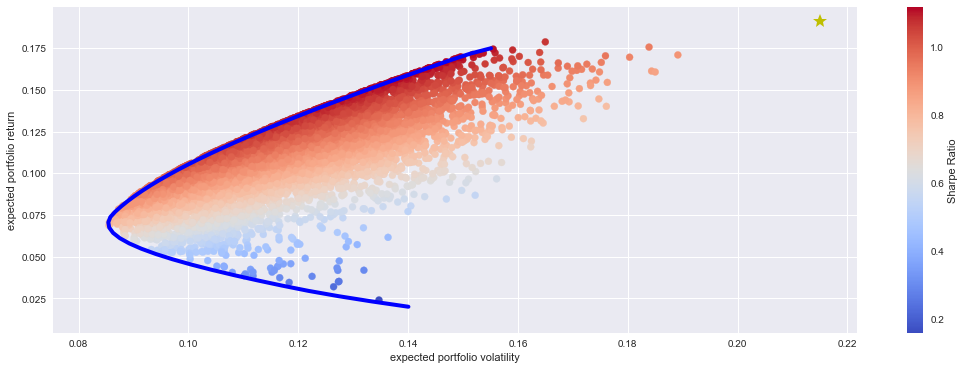

In [82]:
EF_constraints = ({'type' : 'eq', 'fun': lambda x: portfolio_return(x)-target_return},
                  {'type' : 'eq', 'fun': lambda x: np.sum(x)-1})

target_returns = np.linspace(0.02, 0.175, 50)

min_vols = [] 

# this time we are minimizing the portfolio volatility output for a constrained portfolio return
for target_return in target_returns:
    optimized_params = sco.minimize(portfolio_volatility, weights, method = minimizing_algo , bounds = boundaries , constraints = EF_constraints)
    # the fun attribute of the optimized params variable is the minimized output value in this case the volatility
    min_vols.append(optimized_params['fun'])
    
    
min_vols = np.array(min_vols)

plt.figure(figsize =(18,6))
plt.scatter(portfolio_volatilities,portfolio_returns, c = Sharpe_Ratios, marker ='o' , cmap ='coolwarm')
plt.plot(min_vols,target_returns, 'b', lw=4.0)
plt.plot(max_sharpe_volatility,max_sharpe_return, 'y*', markersize=15.0)
plt.ylabel('expected portfolio return')
plt.xlabel('expected portfolio volatility')
plt.colorbar(label = 'Sharpe Ratio')


# Step 7 -  Plotting the capital market line, risky and non risky asset portfolios

Risky assets are not the only the only thing that can be invested in in a portfolio, investors can also invest in cash
which is essentially risk free -  to find the most optimal portfolio to invest in on the efficient front tier we need to 
plot the capital market line. The capital market line represents the market portfolio as for the minimum variance criterion
to hold (the fact all rational investors should want to minimize risk for their target level of return) - the tangential
crossing is the only point on the efficient frontier where the volatility of the portfolio couldnt be 
introduced by introducing cash.
 
The Capital market line is a straight line and will therefore take the form 

*      t(x) = ax + b
 
therefore we need to find the parameters p = (a,b,x)  where a = p[0] , b = p[1] and x=p[2]
 
 
* we know the efficent frontier is a function, f(x)
 
* we know the gradeient of the capital market line = the derivative of f(x) at the tangenital crossing
 
* and we know a = Rf so we need to find a parameters of a and b that creates a straight line that passes through each of the following functions/lines

1)   b = Rf

2)   ax + b = f(x) 

3)   a = f'(x)
    
We can construct the above condidtions into an "equations" function below each condidtion is a simulatneous equation that equals 
zero, so we have 3 simulatneous equations and 3 paramters that need finding therefore we can solve this situation.

The equation of the capital market line is y =  1.1199x +  0.0025 and the tangent it at ( 0.1565, 0.1778)

The optimal portfolio has: 0.0% SBUX 100.0% APPL 0.0% MCD 0.0% GLD

The portfolio is predominantly APPL as apple for the last ten years has very high risk adjusted returns compared to the other 3 instruments show below: 

     statistic           value
------------------------------
           min -0.07031062845014949
           max 0.6214404739986835
          mean 0.19107313555345432
  standard dev 0.04624987484347981
          skew 0.6105647010455277
      kurtosis -0.42917238790907497


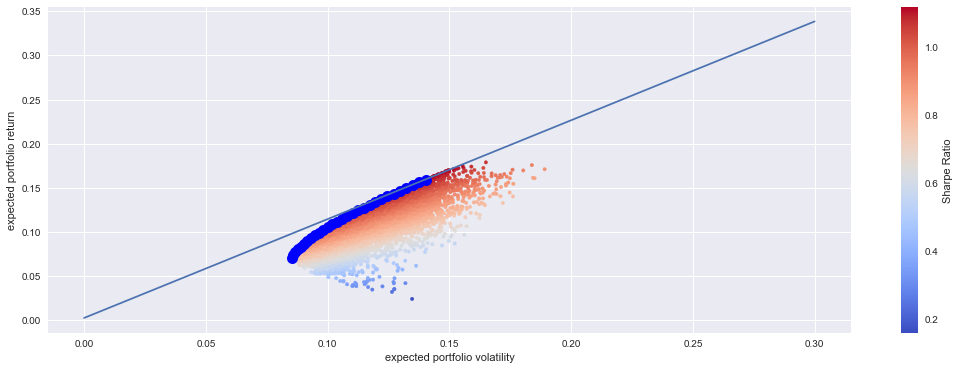

In [99]:

""" This is another 'solver' situation so we can use the scipy package! """

def equations(p, rf=Rf): 
    eq1 = p[1] - rf
    eq2 = rf + p[0]*p[2] - f(p[2])
    eq3 = p[0] - df(p[2])
    return eq1, eq2, eq3
    
"""to find the efficient frontier f(x) and f'(x) we can use cubic spline interplotation which is part of the scipy package it returns the function of 
the line of best fit to data, we will feed it the data point of the efficient frontier to get back a fucntion that
decribes it"""

import scipy.interpolate as sci

""" we use the np.argmin function to remove repeat vol indices by ideniying the index of the first repeat value so that we 
can only keep volatility points from there on after (the efficient frontier) we are interested in the tangiential crossing with the top of the curve. maximum returns """


repeated_index = np.argmin(min_vols)

# nreturn only the coords for the top half of the curve the efficient frontier also need to sort the data for interpolation
# ive added in -5 as the last few data points were duplicate values  and the interpolate algorithmn cant handle them
EFrontier_vols = min_vols[repeated_index:-5]
EFrontier_returns = target_returns[repeated_index:-5]

#fitting the cubic spline to the frontier data points
CubicSplineInterpolation = sci.splrep(EFrontier_vols,EFrontier_returns)

""" define a function for the efficent frontier function and its 1st derivation"""

def f(x):
    ''' Efficient frontier function (the apporximation from the splines interpolation)'''
    return sci.splev(x,CubicSplineInterpolation,der=0)

def df(x):
    ''' Efficient frontier function  1st derivative'''
    return sci.splev(x,CubicSplineInterpolation,der=1)


opt = sco.fsolve(equations, [0.5,0.01,0.15])

tangent_x = opt[2]
tangent_y = opt[0]*opt[2]+opt[1]

print("The equation of the capital market line is y = {0: 2.4f}x + {1: 2.4f} and the tangent it at ({2: 2.4f},{3: 2.4f})".format(opt[0],opt[1],tangent_x,tangent_y)+ '\n')


""" plotting the capitla market line  """ 

plt.figure(figsize=(18,6))
plt.scatter(portfolio_volatilities, portfolio_returns, c = Sharpe_Ratios , marker ='.', cmap ='coolwarm' )
plt.colorbar(label = 'Sharpe Ratio')
plt.scatter(EFrontier_vols, EFrontier_returns, color='b',lw=4.0)

cx = np.linspace(0,0.3)
plt.plot(cx,opt[0]*cx + opt[1], markersize = 15.0)
plt.grid(True)
plt.ylabel('expected portfolio return')
plt.xlabel('expected portfolio volatility')


print('The optimal portfolio has: {}% SBUX {}% APPL {}% MCD {}% GLD'.format(sharpe_optimized_weights[0]*100,sharpe_optimized_weights[1]*100,sharpe_optimized_weights[2]*100,sharpe_optimized_weights[3]*100))

print('\n' +'The portfolio is predominantly APPL as apple for the last ten years has very high risk adjusted returns compared to the other 3 instruments show below: ' + '\n')

print_statistics(APPL)

In [100]:
# Utilising scipy.solve another theoretical example 

In [91]:
""" just to drill the above in we are going to find the crossing point of two lines using the scipy.solve() function """

""" 
this time we want to find the the crossing point of these 2 lines, to do this we need to solve the python function p(a,x) this time we have 2 equations that are just described by
2 unknowns so we need to write a function we 2 simulatanoues equations:

1) y = 2x + a

2) y = 20 - 3x
    
"""

import scipy.optimize as sco
    
def equations(p): 
    eq1 = 2*p[1]+ p[0]
    eq2 = 20 - 3*p[1]
        
    return eq1, eq2

opt = sco.fsolve(equations, [0,0])

print ("paramter a = : {0: 2.2f}  and paramter b :{1: 2.2f}".format(opt[0],opt[1])) 



paramter a = : -13.33  and paramter b : 6.67
